### 📊 Linear Regression - Predicting Player Value
🔍 Goal:
Estimate a player's market value based on physical and skill attributes.

### ✅ Features Used:

Age, Overall, Potential, Club, Special, Preferred Foot (encoded), International Reputation, Weak Foot, Skill Moves, Release Clause, Height (in cm), Weight (in kg)

### 🧹 Data Preprocessing:

1. Handled missing values

2. Converted height/weight to numeric

3. Encoded categorical variables using LabelEncoder

### 📈 Model Used:

- LinearRegression() from sklearn

Trained on 80% of the data, tested on 20%

📉 Evaluation:

MAE: ~450,000 €

RMSE: ~1,095,000 €

Interpretation: Prediction errors around 1 million EUR (reasonable but improvable)

### ADONIT HALILI

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import seaborn as sns
import plotly.express as px

In [21]:
df = pd.read_csv('FIFA23_official_data.csv')

In [22]:
df.head()

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,...,Real Face,Position,Joined,Loaned From,Contract Valid Until,Height,Weight,Release Clause,Kit Number,Best Overall Rating
0,209658,L. Goretzka,27,https://cdn.sofifa.net/players/209/658/23_60.png,Germany,https://cdn.sofifa.net/flags/de.png,87,88,FC Bayern München,https://cdn.sofifa.net/teams/21/30.png,...,Yes,"<span class=""pos pos28"">SUB","Jul 1, 2018",NaN,2026,189cm,82kg,€157M,8.0,NaN
1,212198,Bruno Fernandes,27,https://cdn.sofifa.net/players/212/198/23_60.png,Portugal,https://cdn.sofifa.net/flags/pt.png,86,87,Manchester United,https://cdn.sofifa.net/teams/11/30.png,...,Yes,"<span class=""pos pos15"">LCM","Jan 30, 2020",NaN,2026,179cm,69kg,€155M,8.0,NaN
2,224334,M. Acuña,30,https://cdn.sofifa.net/players/224/334/23_60.png,Argentina,https://cdn.sofifa.net/flags/ar.png,85,85,Sevilla FC,https://cdn.sofifa.net/teams/481/30.png,...,No,"<span class=""pos pos7"">LB","Sep 14, 2020",NaN,2024,172cm,69kg,€97.7M,19.0,NaN
3,192985,K. De Bruyne,31,https://cdn.sofifa.net/players/192/985/23_60.png,Belgium,https://cdn.sofifa.net/flags/be.png,91,91,Manchester City,https://cdn.sofifa.net/teams/10/30.png,...,Yes,"<span class=""pos pos13"">RCM","Aug 30, 2015",NaN,2025,181cm,70kg,€198.9M,17.0,NaN
4,224232,N. Barella,25,https://cdn.sofifa.net/players/224/232/23_60.png,Italy,https://cdn.sofifa.net/flags/it.png,86,89,Inter,https://cdn.sofifa.net/teams/44/30.png,...,Yes,"<span class=""pos pos13"">RCM","Sep 1, 2020",NaN,2026,172cm,68kg,€154.4M,23.0,NaN


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17660 entries, 0 to 17659
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        17660 non-null  int64  
 1   Name                      17660 non-null  object 
 2   Age                       17660 non-null  int64  
 3   Photo                     17660 non-null  object 
 4   Nationality               17660 non-null  object 
 5   Flag                      17660 non-null  object 
 6   Overall                   17660 non-null  int64  
 7   Potential                 17660 non-null  int64  
 8   Club                      17449 non-null  object 
 9   Club Logo                 17660 non-null  object 
 10  Value                     17660 non-null  object 
 11  Wage                      17660 non-null  object 
 12  Special                   17660 non-null  int64  
 13  Preferred Foot            17660 non-null  object 
 14  Intern

In [24]:
df.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Kit Number
count,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17625.000000
mean,246319.424462,23.127746,63.369592,70.981200,1537.915855,1.106285,2.900340,2.297169,25.037957
std,31487.892861,4.639821,8.036268,6.529836,285.893809,0.407021,0.663523,0.754264,19.154116
min,16.000000,15.000000,43.000000,42.000000,749.000000,1.000000,1.000000,1.000000,1.000000
25%,240732.500000,20.000000,58.000000,67.000000,1387.000000,1.000000,3.000000,2.000000,11.000000
50%,257041.000000,22.000000,63.000000,71.000000,1548.000000,1.000000,3.000000,2.000000,22.000000
75%,263027.500000,26.000000,69.000000,75.000000,1727.000000,1.000000,3.000000,3.000000,32.000000
max,271340.000000,54.000000,91.000000,95.000000,2312.000000,5.000000,5.000000,5.000000,99.000000


In [25]:
df.isnull().sum()

ID                              0
Name                            0
Age                             0
Photo                           0
Nationality                     0
Flag                            0
Overall                         0
Potential                       0
Club                          211
Club Logo                       0
Value                           0
Wage                            0
Special                         0
Preferred Foot                  0
International Reputation        0
Weak Foot                       0
Skill Moves                     0
Work Rate                       0
Body Type                      38
Real Face                      38
Position                       35
Joined                       1098
Loaned From                 16966
Contract Valid Until          361
Height                          0
Weight                          0
Release Clause               1151
Kit Number                     35
Best Overall Rating         17639
dtype: int64

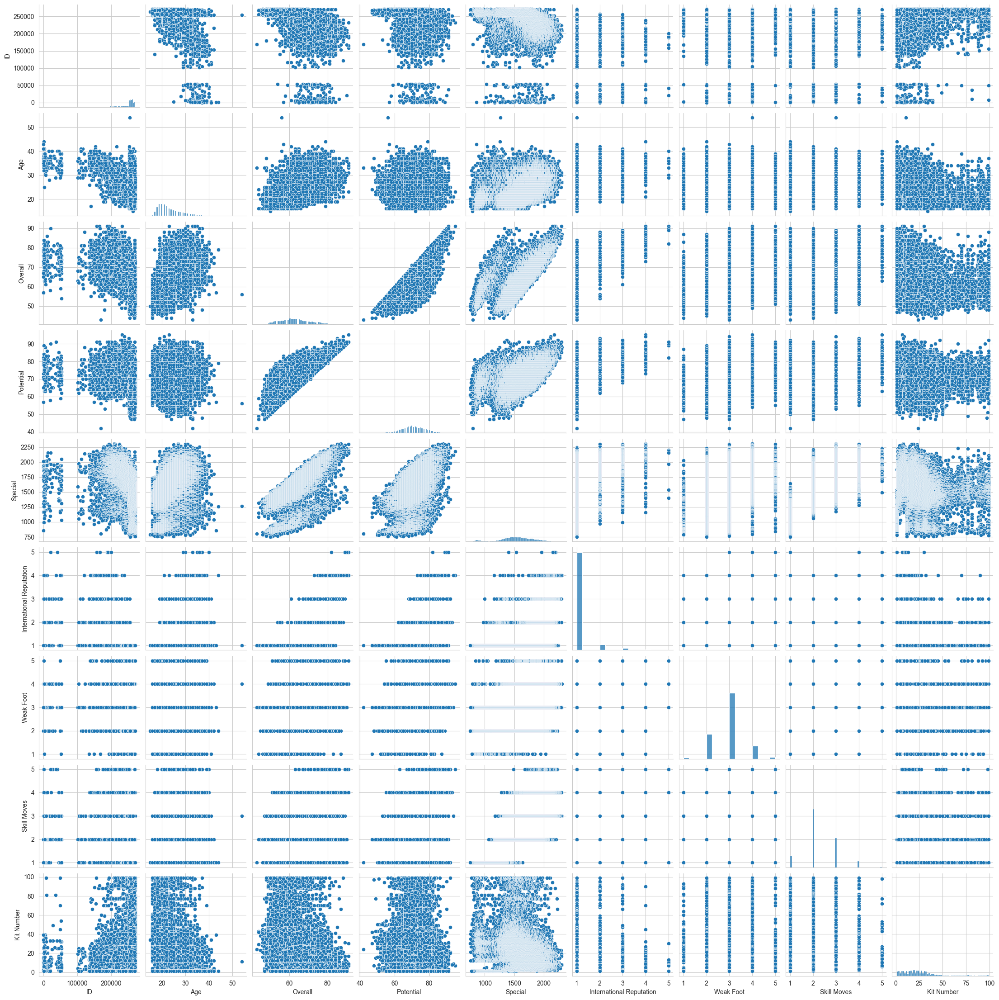

In [26]:
sns.pairplot(df)

In [27]:
px.box(df, x='Position', y='Value')

In [28]:
px.histogram(df, x='Value', nbins=20)

<Axes: >

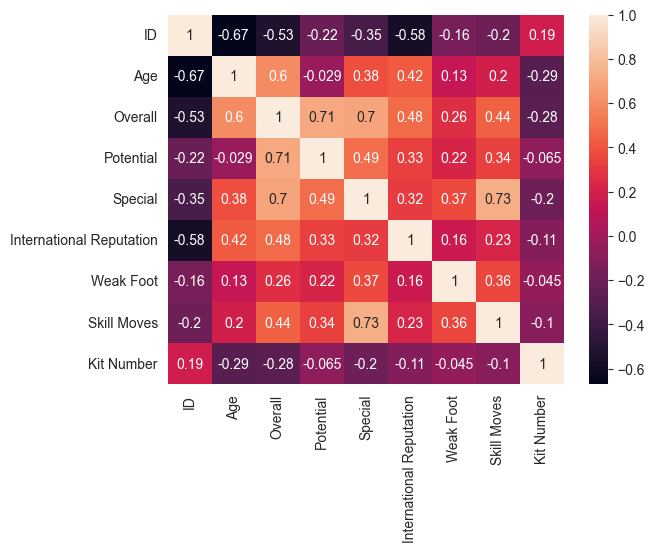

In [29]:
sns.heatmap(df.corr(numeric_only=True), annot=True)

In [30]:
drop_cols = ['ID', 'Name', 'Photo', 'Flag', 'Club Logo', 'Wage',
             'Loaned From', 'Joined', 'Contract Valid Until', 'Kit Number'
    , 'Nationality', 'Weight', 'Real Face']
df.drop(drop_cols, axis=1, inplace=True)

In [31]:
def parse_currency(val):
    if isinstance(val, str):
        val = val.replace('€', '').replace('K', 'e3').replace('M', 'e6')
        return float(eval(val))
    return np.nan

In [32]:
df.dropna(subset=['Position'], inplace=True)

In [33]:
df['Club'] = df['Club'].fillna('Free Agent')

In [34]:
df['Body Type'] = df['Body Type'].fillna(df['Body Type'].mode()[0])

In [35]:
df['Release Clause'] = df['Release Clause'].apply(parse_currency)
df['Release Clause'] = df['Release Clause'].fillna(df['Release Clause'].median())

In [36]:
df['ValueEUR'] = df['Value'].apply(parse_currency)

In [37]:
df['Body Type'] = df['Body Type'].fillna(df['Body Type'].mode()[0])

In [38]:
df.head()

,Age,Overall,Potential,Club,Value,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Height,Release Clause,Best Overall Rating,ValueEUR
0,27,87,88,FC Bayern München,€91M,2312,Right,4.0,4.0,3.0,High/ Medium,Unique,"<span class=""pos pos28"">SUB",189cm,157000000.0,NaN,91000000.0
1,27,86,87,Manchester United,€78.5M,2305,Right,3.0,3.0,4.0,High/ High,Unique,"<span class=""pos pos15"">LCM",179cm,155000000.0,NaN,78500000.0
2,30,85,85,Sevilla FC,€46.5M,2303,Left,2.0,3.0,3.0,High/ High,Stocky (170-185),"<span class=""pos pos7"">LB",172cm,97700000.0,NaN,46500000.0
3,31,91,91,Manchester City,€107.5M,2303,Right,4.0,5.0,4.0,High/ High,Unique,"<span class=""pos pos13"">RCM",181cm,198900000.0,NaN,107500000.0
4,25,86,89,Inter,€89.5M,2296,Right,3.0,3.0,3.0,High/ High,Normal (170-),"<span class=""pos pos13"">RCM",172cm,154400000.0,NaN,89500000.0


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17625 entries, 0 to 17659
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       17625 non-null  int64  
 1   Overall                   17625 non-null  int64  
 2   Potential                 17625 non-null  int64  
 3   Club                      17625 non-null  object 
 4   Value                     17625 non-null  object 
 5   Special                   17625 non-null  int64  
 6   Preferred Foot            17625 non-null  object 
 7   International Reputation  17625 non-null  float64
 8   Weak Foot                 17625 non-null  float64
 9   Skill Moves               17625 non-null  float64
 10  Work Rate                 17625 non-null  object 
 11  Body Type                 17625 non-null  object 
 12  Position                  17625 non-null  object 
 13  Height                    17625 non-null  object 
 14  Release Cla

In [40]:
df.isna().sum()

Age                             0
Overall                         0
Potential                       0
Club                            0
Value                           0
Special                         0
Preferred Foot                  0
International Reputation        0
Weak Foot                       0
Skill Moves                     0
Work Rate                       0
Body Type                       0
Position                        0
Height                          0
Release Clause                  0
Best Overall Rating         17625
ValueEUR                        0
dtype: int64

In [41]:
X = df.drop('ValueEUR', axis=1)
y = df['ValueEUR']

In [42]:
from sklearn.preprocessing import LabelEncoder

object_cols = X.select_dtypes(include=['object']).columns

# Label encode them
le = LabelEncoder()
for col in object_cols:
    X[col] = le.fit_transform(X[col].astype(str))


In [43]:
print(X.select_dtypes(include=['object']).columns)  # should print nothing

Index([], dtype='object')


In [44]:
def convert_height(h):
    try:
        feet, inches = h.split("'")
        inches = inches.replace('"', '').strip()
        return int(feet) * 30.48 + int(inches) * 2.54
    except:
        return np.nan


df['Height'] = df['Height'].apply(convert_height)

In [45]:
def parse_value(val):
    val = val.replace('€', '')
    if 'M' in val:
        return float(val.replace('M', '')) * 1_000_000
    elif 'K' in val:
        return float(val.replace('K', '')) * 1_000
    else:
        try:
            return float(val)
        except:
            return 0


df['Value'] = df['Value'].apply(parse_value)

In [46]:
df.head()

,Age,Overall,Potential,Club,Value,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Height,Release Clause,Best Overall Rating,ValueEUR
0,27,87,88,FC Bayern München,91000000.0,2312,Right,4.0,4.0,3.0,High/ Medium,Unique,"<span class=""pos pos28"">SUB",NaN,157000000.0,NaN,91000000.0
1,27,86,87,Manchester United,78500000.0,2305,Right,3.0,3.0,4.0,High/ High,Unique,"<span class=""pos pos15"">LCM",NaN,155000000.0,NaN,78500000.0
2,30,85,85,Sevilla FC,46500000.0,2303,Left,2.0,3.0,3.0,High/ High,Stocky (170-185),"<span class=""pos pos7"">LB",NaN,97700000.0,NaN,46500000.0
3,31,91,91,Manchester City,107500000.0,2303,Right,4.0,5.0,4.0,High/ High,Unique,"<span class=""pos pos13"">RCM",NaN,198900000.0,NaN,107500000.0
4,25,86,89,Inter,89500000.0,2296,Right,3.0,3.0,3.0,High/ High,Normal (170-),"<span class=""pos pos13"">RCM",NaN,154400000.0,NaN,89500000.0


In [47]:
lr = LinearRegression()

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [49]:
X_train.head()

,Age,Overall,Potential,Club,Value,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Height,Release Clause,Best Overall Rating
6023,22,63,74,803,1,1654,1,1.0,3.0,4.0,6,2,15,30,1600000.0,0
17163,16,53,73,558,76,866,1,1.0,3.0,1.0,8,2,21,40,656000.0,0
1750,35,71,71,796,111,1896,0,2.0,2.0,3.0,8,4,20,22,1300000.0,0
2661,26,66,70,443,1,1828,1,1.0,3.0,2.0,6,4,2,28,2400000.0,0
13361,22,52,62,493,48,1382,1,1.0,3.0,2.0,8,3,20,15,261000.0,0


In [50]:
lr.fit(X_train, y_train)

LinearRegression()

In [51]:
predicted = lr.predict(X_test)

In [52]:
mae = mean_absolute_error(y_test, predicted)
mse = mean_squared_error(y_test, predicted)
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

MAE: 453487.22776164644
MSE: 1200949158804.0674
RMSE: 1095878.2591164345


In [53]:
from sklearn.metrics import r2_score

r2 = r2_score(y_test, predicted)
print(f"R² Score: {r2}")

R² Score: 0.9793847153613231


In [54]:
px.scatter(x=y_test, y=predicted)

In [55]:
y.mean()

np.float64(2745215.489361702)

In [56]:
pd.DataFrame(lr.coef_, index=X.columns)
# Each coefficient tells you how much the model increases or decreases the predicted value when that feature increases by 1 unit.

,0
Age,-9.533366e+04
Overall,8.408965e+04
Potential,-4.459992e+04
Club,-1.233613e+01
Value,2.351945e+02
Special,5.365624e+00
Preferred Foot,-2.690173e+04
International Reputation,1.114268e+06
Weak Foot,-2.165084e+04
Skill Moves,6.860456e+04
